<a href="https://colab.research.google.com/github/mrbarron3/fwe458/blob/main/Homework9/Homework9_Barron.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [82]:
# imports
import pandas as pd
from google.colab import drive
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.naive_bayes import GaussianNB


In [3]:
drive.mount('/content/drive')

filedir = "/content/drive/MyDrive/Spring '25/FWE458/"
fname = filedir + "SW_with_AOD.csv"

Mounted at /content/drive


### Loading the dataset + checking for missing values or obvious outliers

In [12]:
# reading in the data
df = pd.read_csv(fname)

# find the lowest and highest values in each column and check that they make sense
for col in df.columns:
  min = df[col].min()
  max = df[col].max()
  print(f"{col}: max = {max}, min = {min}")
# there are no negative values or huge rounded whole numbers, so I will continue with the original dataset

# check to see if there are any missing values
df.isnull().sum()

SZA: max = 69.99932861, min = 0.325057983
AOD: max = 5.267974899, min = 0.001963017
COD: max = 16.27, min = 3.08e-05
CLD_FRAC: max = 0.645195663, min = 0.0
UW: max = 6.701678276, min = 0.093588173
TO3: max = 488.9841003, min = 190.3525085
Pressure: max = 1013.25, min = 762.2340698
BSA: max = 0.746, min = 0.006
WSA: max = 0.724, min = 0.006
SW_direct: max = 1116.736084, min = 0.001666667
SW_diffuse: max = 842.5145264, min = 0.0


,0
SZA,0
AOD,0
COD,0
CLD_FRAC,0
UW,0
TO3,0
Pressure,0
BSA,0
WSA,0
SW_direct,0


### Creating new columns

In [24]:
# create the SW_total column
df["SW_total"] = df["SW_direct"] + df["SW_diffuse"]

# define variables before function to reduce time function takes
q1 = df["SW_total"].quantile(0.25)
q2 = df["SW_total"].quantile(0.5)
q3 = df["SW_total"].quantile(0.75)

# function to assist with categorization
def sw_quartiles(sw):
  # check which quartile sw is in and categorize it
  if sw < q1:
    return "Q1"
  elif sw < q2:
    return "Q2"
  elif sw < q3:
    return "Q3"
  else:
    return "Q4"

# apply the previous function on the SW_total column to create a new column with categories
df["SW_total_category"] = df["SW_total"].apply(sw_quartiles)

# verify the last 10 rows are categorized correctly
print(df["SW_total"].min(), q1, q2, q3, df["SW_total"].max())
df[["SW_total", "SW_total_category"]].tail(10)

0.764696598 466.96225165 635.24290465 800.357952165 1175.2438508


,SW_total,SW_total_category
35214,997.396210,Q4
35215,488.517983,Q2
35216,295.476669,Q1
35217,457.362244,Q1
35218,476.379181,Q2
35219,682.305633,Q3
35220,456.540008,Q1
35221,397.228920,Q1
35222,436.438309,Q1
35223,773.424377,Q3


### Visual Exploration

In [ ]:
# my plot displays locally, but when I upload to github it doesn't display the plot or anything after so I moved the uncommented code to the very last cell in this notebook.
# fig, ax = plt.subplots(figsize=(15,5))
# sns.pairplot(data = df,
#              hue = "SW_total_category")

# plt.show()

### Unsupervised Learning

In [29]:
# split dataframe into features and targets
features = df[["SZA", "AOD", "COD", "CLD_FRAC", "UW", "TO3", "Pressure", "BSA", "WSA"]]
targets = df[["SW_direct", "SW_diffuse", "SW_total", "SW_total_category"]]

# normalize all the features to [0, 1] using min max normalization
for col in features.columns:
  features[col] = (features[col] - features[col].min(axis = 0)) / (features[col].max(axis = 0) - features[col].min(axis = 0))

# verify that the features have been normalized
features.head()

<ipython-input-29-43b8db3d6512>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features[col] = (features[col] - features[col].min(axis = 0)) / (features[col].max(axis = 0) - features[col].min(axis = 0))


,SZA,AOD,COD,CLD_FRAC,UW,TO3,Pressure,BSA,WSA
0,0.353240,0.222356,0.149968,0.444123,0.291751,0.405407,0.784217,0.210811,0.260446
1,0.495735,0.308581,0.284571,0.726651,0.721282,0.396344,0.821436,0.201351,0.227019
2,0.387602,0.207566,0.124768,0.467166,0.784640,0.344805,0.899570,0.175676,0.199164
3,0.287576,0.213554,0.338044,0.584348,0.720758,0.439155,0.858018,0.202703,0.240947
4,0.188135,0.137388,0.045240,0.116830,0.083333,0.351927,0.478405,0.245946,0.286908


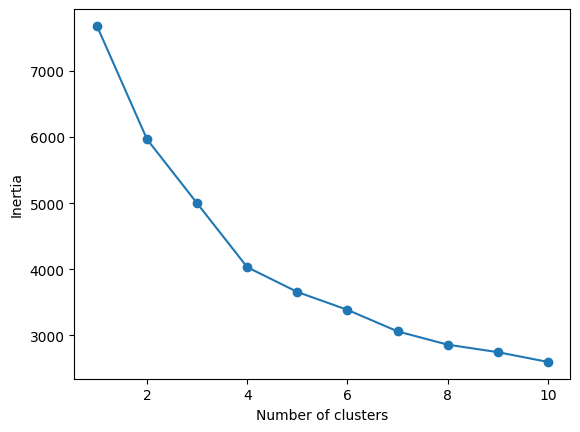

In [36]:
# determine the optimal number of clusters using the elbow method
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(features)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()
# at 4 clusters the most elbow like shape appears, I will be using this as my K value

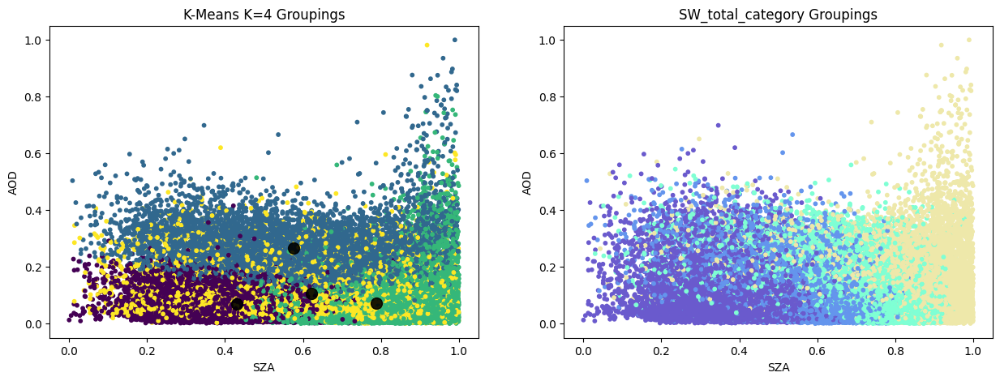

In [58]:
# fit the model with 4 clusters
kmeans = KMeans(n_clusters=4)
kmeans.fit(features)
y_kmeans = kmeans.predict(features)

fig, ax = plt.subplots(1,2,figsize=(15,5))
# visualize the clusters with SZA and AOD
ax[0].scatter(features["SZA"], features["AOD"], c=y_kmeans, s=10)

# find the centroids and plot them
centers = kmeans.cluster_centers_
ax[0].scatter(centers[:, 0], centers[:, 1], c='black', s=100, alpha=0.9);
ax[0].set_title("K-Means K=4 Groupings")

# visualize the groupings of SW_total_category
color_map = {"Q1": "palegoldenrod", "Q2": "aquamarine", "Q3": "cornflowerblue", "Q4": "slateblue"}
ax[1].scatter(features["SZA"], features["AOD"], c=targets["SW_total_category"].map(color_map), s=10)
ax[1].set_title("SW_total_category Groupings")

# set the axes labels
for i in range(2):
  ax[i].set_xlabel("SZA")
  ax[i].set_ylabel("AOD")

plt.show()

These K-Means clusters do not align with SW_total_category, and therefore are not meaningful interms of solar radiationcategories. The SW_total_category variable mostly aligns with the SZA variable, whereas K-Means is taking relative proximity of both variables into account, making the groupings look very different. The K-Means graph is more blobby, whereas the SW_toal_category graph looks a little more streaky.

### Supervised Learning

In [71]:
# split the data into training and testing, 20% split, using only SW_total as the y variable
Xtrain, Xtest, ytrain, ytest = train_test_split(features, targets["SW_total"], test_size=0.2)

# create the decision tree regressor and train it
treemodel = DecisionTreeRegressor(max_depth = 5)

treemodel.fit(Xtrain, ytrain)

# predict decision tree on the testing dataset
ypred_test = treemodel.predict(Xtest)

# find the RMSE and R**2
rmse = np.sqrt(np.mean((ytest-ypred_test)**2))
r_squared = treemodel.score(features, targets["SW_total"])
print(f"Decision Tree: RMSE = {rmse}, R^2 = {r_squared}")


# create the random forest regressor and train it (10 trees, same max_depth as decision tree above)
forest = RandomForestRegressor(10, max_depth=5)

forest.fit(Xtrain, ytrain)

# predict random forest on the testing dataset
ypred_test = forest.predict(Xtest)

# find the RMSE and R**2
rmse = np.sqrt(np.mean((ytest-ypred_test)**2))
r_squared = forest.score(features, targets["SW_total"])
print(f"Random Forest: RMSE = {rmse}, R^2 = {r_squared}")

Decision Tree: RMSE = 110.9012067851487, R^2 = 0.7499107453141909
Random Forest: RMSE = 107.96574503025798, R^2 = 0.7619059241535526


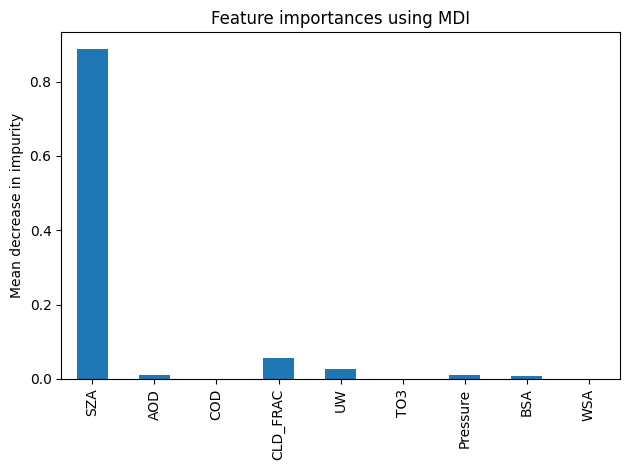

In [73]:
# graph the feature importances of the random forest model
importances = forest.feature_importances_
importances

feature_names = ["SZA", "AOD", "COD", "CLD_FRAC", "UW", "TO3", "Pressure", "BSA", "WSA"]
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [84]:
# split the data into training and testing, 20% split, using only SW_total_category as the y variable
Xtrain, Xtest, ytrain, ytest = train_test_split(features, targets["SW_total_category"], test_size=0.2)

# train and fit a knn model
knn_model = KNeighborsClassifier(n_neighbors=3)

knn_model.fit(Xtrain, ytrain)

# predict the model on the testing dataset
ypred = knn_model.predict(Xtest)


# create a function to do score reporting
def score_reporting(model, test, pred):
  print(f"{model}:")
  # compare predicted values to actual values via the confusion matrix
  mtx = metrics.confusion_matrix(ytest, ypred)

  # TP   |   FP
  # FN   |   TN
  print(mtx)

  accuracy = accuracy_score(test, pred)
  precision = precision_score(test, pred, average = 'macro')
  recall = recall_score(test, pred, average = 'macro')

  print(f"The accuracy score is: {accuracy}")
  print(f"The precision score is: {precision}")
  print(f"The recall score is: {recall}\n")

score_reporting("KNN", ytest, ypred)


# train and fit a gaussianNB model
gnb = GaussianNB()

gnb.fit(Xtrain, ytrain)

# predict the model on the testing dataset
ypred = gnb.predict(Xtest)

score_reporting("GaussianNB", ytest, ypred)

KNN:
[[1290  351   80   30]
 [ 381 1037  318   64]
 [ 112  325 1024  286]
 [  34   74  248 1391]]
The accuracy score is: 0.6731014904187367
The precision score is: 0.6722173173567471
The recall score is: 0.6738006902716442

GaussianNB:
[[1222  370  109   50]
 [ 313 1072  327   88]
 [  35  419  981  312]
 [   8    7  351 1381]]
The accuracy score is: 0.6608942512420156
The precision score is: 0.6643426720642246
The recall score is: 0.6613686330664739



The KNN (n_neighbors=3) performed slightly better than the Gaussian model. Gaussian assumes normal distribution, and based upon the pairplot histogram distributions, most of our variables are not normally distributed. KNN does not make this assumption, which makes this a better choice for this dataset.

### Reflection and Recommendation

The most important input features for predicting total shortwave radiation are SZA, CLD_FRAC and UW, with SZA being the most important feature by far with an MDI of over 0.85.

I can't discern any clear patterns from the clusters. The only slight pattern I notice from the classification groups is that the groups appear to be mostly based off change in SZA and less related to change in AOD, which would make sense given that SZA is the most important feature.

Based on these results, I think a linear regression could work since one feature holds the main importance. Out of the modeling strategies we used here, I would recommend using a random forest regression so we can try to predict the actual value of solar radiation, rather than a rough estimate of the quartile of solar radiation.

### Visual Exploration

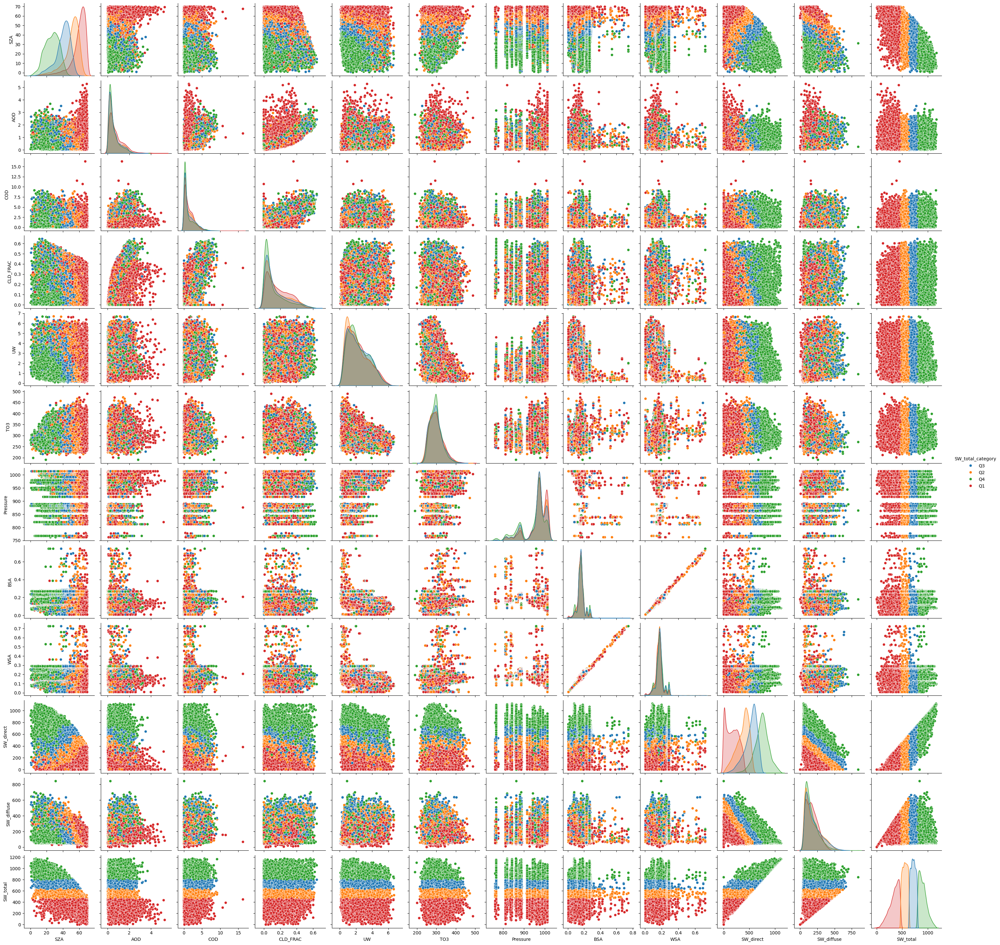

In [26]:
# visualize relationships among all features (skipping optional normalization for now)
fig, ax = plt.subplots(figsize=(15,5))
sns.pairplot(data = df,
             hue = "SW_total_category")

plt.show()